In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

import clustering_algorithms
from clustering_algorithms import clustering_pipeline
from clustering_algorithms import many_kmeans
from clustering_algorithms import many_db
from clustering_algorithms import many_meanshift
from clustering_algorithms import many_spectral
from clustering_algorithms import cosine_similarity
from clustering_algorithms import best_cluster

plt.style.use("seaborn")
%matplotlib inline

# Read in Data

In [2]:
df=pd.read_csv('final_df.csv')
df=df.drop('Unnamed: 0', 1)
df.head()

,name,location.lat,location.lon,minority_serving.historically_black,act_scores.midpoint.cumulative,sat_scores.average.overall,demographics.race_ethnicity.white,net_price_less_30000,net_price_30001_48000,net_price_48001_75000,...,open_admissions_policy,accreditor_code,outcome_cohort.full_time.first_time.6yr,outcome_cohort.full_time.first_time.8yr,outcome_cohort.part_time.first_time.6yr,outcome_cohort.part_time.first_time.8yr,outcome_cohort.full_time.not_first_time.6yr,outcome_cohort.full_time.not_first_time.8yr,outcome_cohort.part_time.not_first_time.6yr,outcome_cohort.part_time.not_first_time.8yr
0,Alabama A & M University,34.783368,-86.568502,1.0,18.0,850.0,0.0340,13075.0,12458.0,15857.0,...,2.0,SACSCC,1044.0,1044.0,2.0,2.0,110.0,110.0,16.0,16.0
1,University of Alabama at Birmingham,33.502230,-86.809170,0.0,25.0,1147.0,0.5863,13614.0,14746.0,17601.0,...,2.0,SACSCC,1246.0,1245.0,30.0,30.0,686.0,686.0,248.0,248.0
2,University of Alabama in Huntsville,34.722818,-86.638420,0.0,27.0,1221.0,0.7024,15252.0,17228.0,19178.0,...,2.0,SACSCC,765.0,765.0,31.0,31.0,483.0,483.0,131.0,131.0
3,Alabama State University,32.364317,-86.295677,1.0,18.0,844.0,0.0165,7519.0,2611.0,9831.0,...,2.0,SACSCC,1330.0,1330.0,49.0,49.0,177.0,177.0,36.0,36.0
4,The University of Alabama,33.214400,-87.545766,0.0,27.0,1181.0,0.7807,17263.0,19279.0,21309.0,...,2.0,SACSCC,5009.0,5009.0,82.0,82.0,1131.0,1131.0,210.0,210.0


# Set Data Types

In [3]:
division=list(df.division)

In [4]:
df=df.drop(columns=['title_iv.approval_date', 'accreditor_code', 'city', 'state', 'Description', 'division', 'accreditor', 'school_url', 'price_calculator_url', 'rank_lac', 'Rank'])

In [5]:
names=df['name']
df=df.drop(columns=['name'])

In [6]:
for column in df.columns:
    try:
        df[f'{column}'].astype(float)
    except:
        new_col=[]
        for value in df[f'{column}']:
            try:
                new_col.append(float(value))
            except:
                new_col.append(0)
        df[f'{column}']=(new_col)

In [7]:
np.any(np.isnan(df))

False

In [8]:
df['division']=division

In [9]:
df=pd.get_dummies(df, columns=['division'])

In [10]:
df.dtypes

location.lat                                          float64
location.lon                                          float64
minority_serving.historically_black                   float64
act_scores.midpoint.cumulative                        float64
sat_scores.average.overall                            float64
demographics.race_ethnicity.white                     float64
net_price_less_30000                                  float64
net_price_30001_48000                                 float64
net_price_48001_75000                                 float64
net_price_75001_110000                                float64
net_price_above_110001                                float64
demographics.women                                    float64
locale                                                float64
admission_rate.overall                                float64
size                                                  float64
early_pay                                             float64
ownershi

# EDA

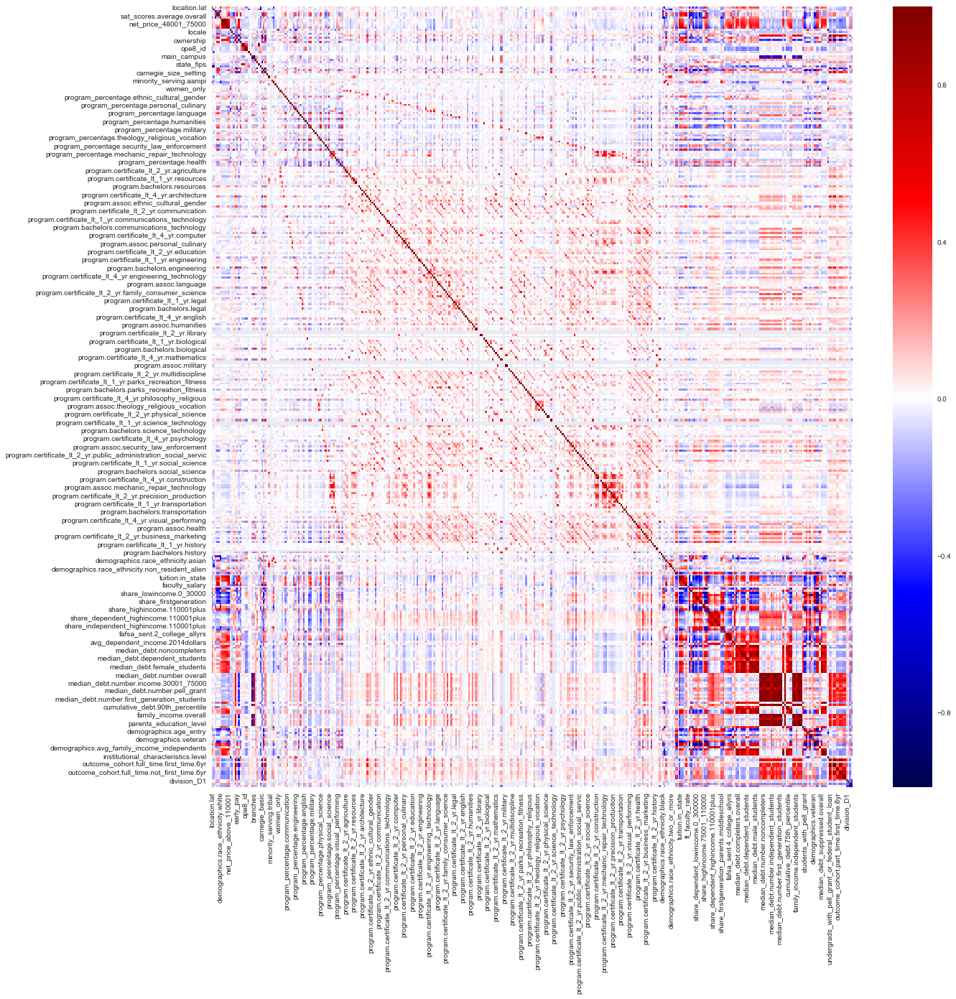

In [11]:
f, ax = plt.subplots(figsize=(20,20))

sns.heatmap(df.corr(), cmap="seismic");

In [12]:
df.corr()[df.corr()>0.75]

,location.lat,location.lon,minority_serving.historically_black,act_scores.midpoint.cumulative,sat_scores.average.overall,demographics.race_ethnicity.white,net_price_less_30000,net_price_30001_48000,net_price_48001_75000,net_price_75001_110000,...,outcome_cohort.part_time.first_time.6yr,outcome_cohort.part_time.first_time.8yr,outcome_cohort.full_time.not_first_time.6yr,outcome_cohort.full_time.not_first_time.8yr,outcome_cohort.part_time.not_first_time.6yr,outcome_cohort.part_time.not_first_time.8yr,division_D1,division_D2,division_D3,division_non_ncaa
location.lat,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location.lon,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
minority_serving.historically_black,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
act_scores.midpoint.cumulative,NaN,NaN,NaN,1.000000,0.837301,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sat_scores.average.overall,NaN,NaN,NaN,0.837301,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
demographics.race_ethnicity.white,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
net_price_less_30000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.940599,0.899582,0.760098,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
net_price_30001_48000,NaN,NaN,NaN,NaN,NaN,NaN,0.940599,1.000000,0.925993,0.783487,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
net_price_48001_75000,NaN,NaN,NaN,NaN,NaN,NaN,0.899582,0.925993,1.000000,0.865619,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
net_price_75001_110000,NaN,NaN,NaN,NaN,NaN,NaN,0.760098,0.783487,0.865619,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Scale

In [13]:
df_std = StandardScaler().fit_transform(df)

# Choose Number of Components For PCA
Using PCA to Reduce Dimensionality
+ Decreases Interperetability, Going to Review Clusters After to Choose Best Cluster

In [14]:
cluster=clustering_algorithms.clustering_pipeline(100)

In [15]:
cluster.fit(df_std)

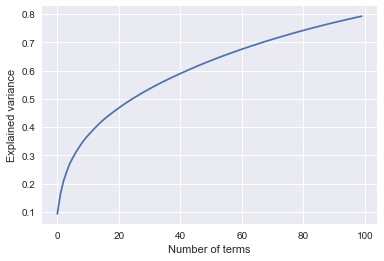

In [16]:
cluster.pca_plot()

# Choose Perplexity for TSNE

In [17]:
cluster.kmeans(10)

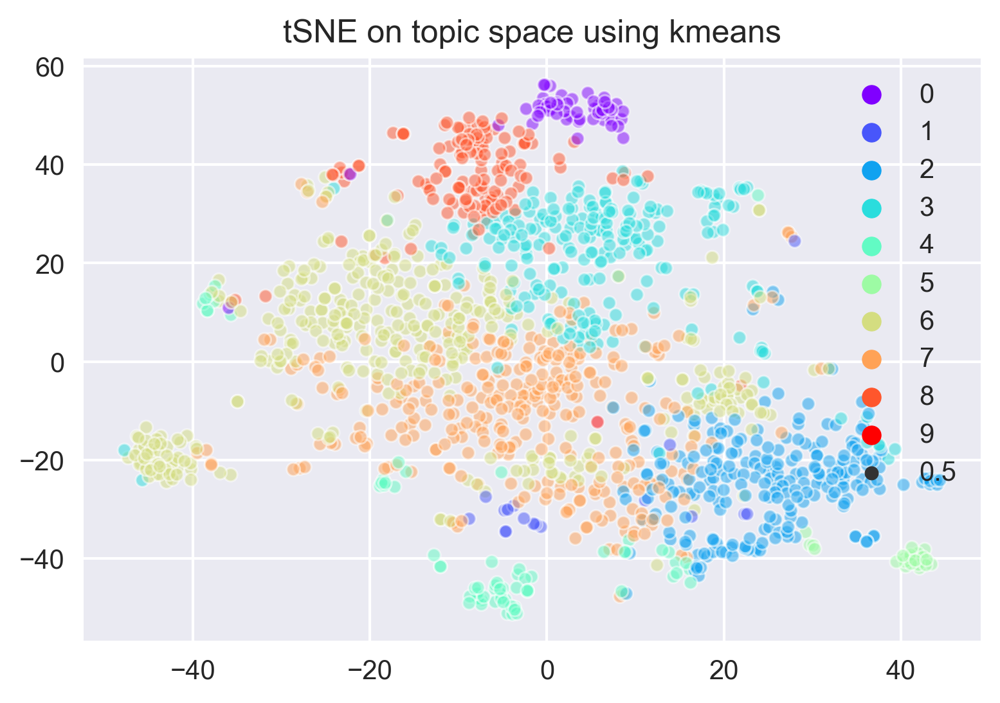

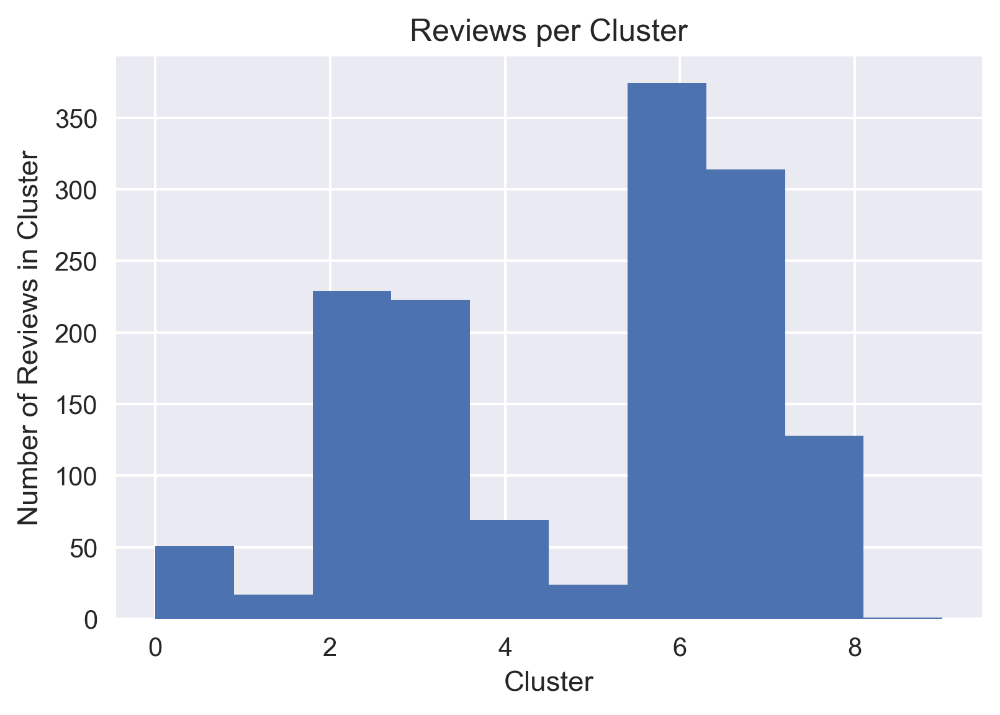

In [18]:
# cluster.tsne(2, 5)
# cluster.tsne(2, 25)
cluster.tsne(2, 30)
# cluster.tsne(2, 40)
# cluster.tsne(2, 50)

# KMeans

In [19]:
km_cluster=clustering_algorithms.clustering_pipeline(100)

In [20]:
km_cluster.fit(df_std)


-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------


/Users/mayamadhavan/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------

-------------------------------------NEXT CLUSTER -------------------------------------------


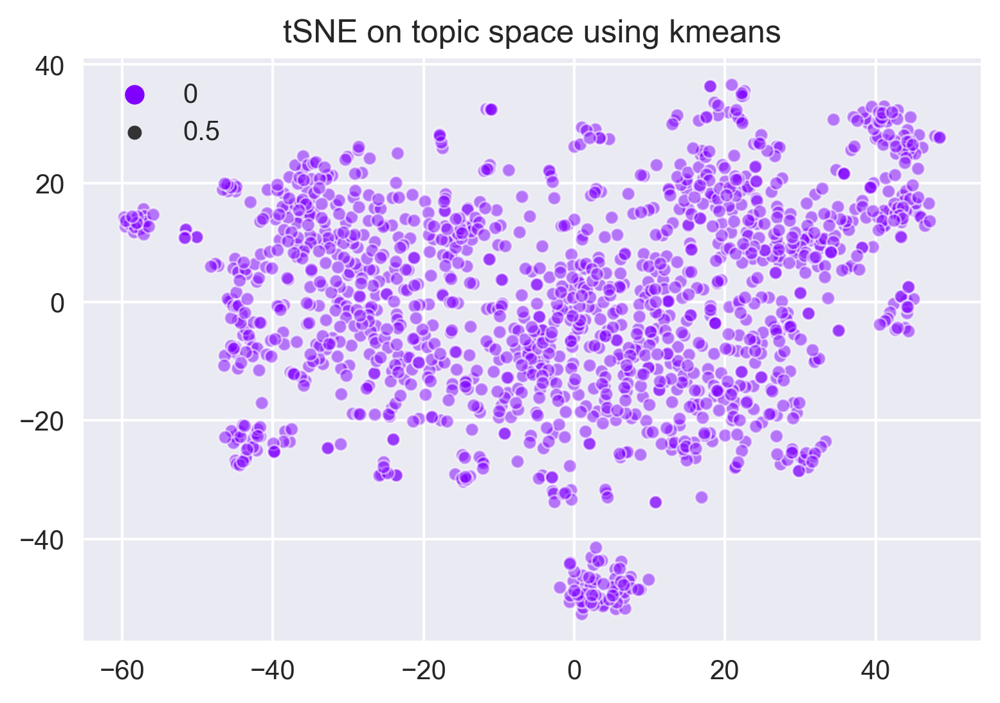

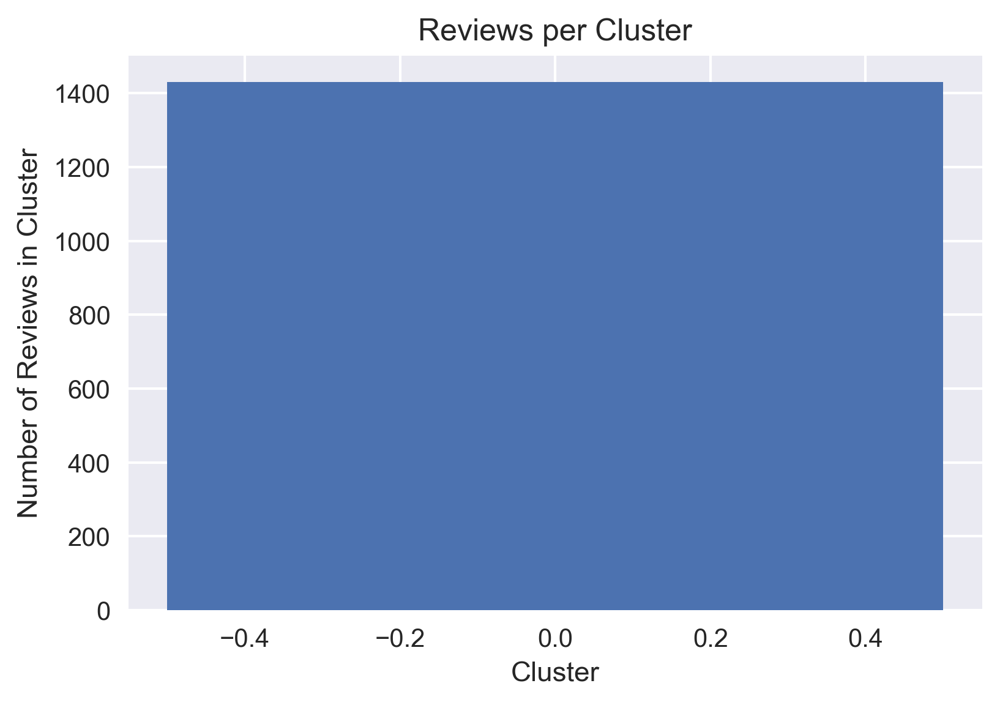

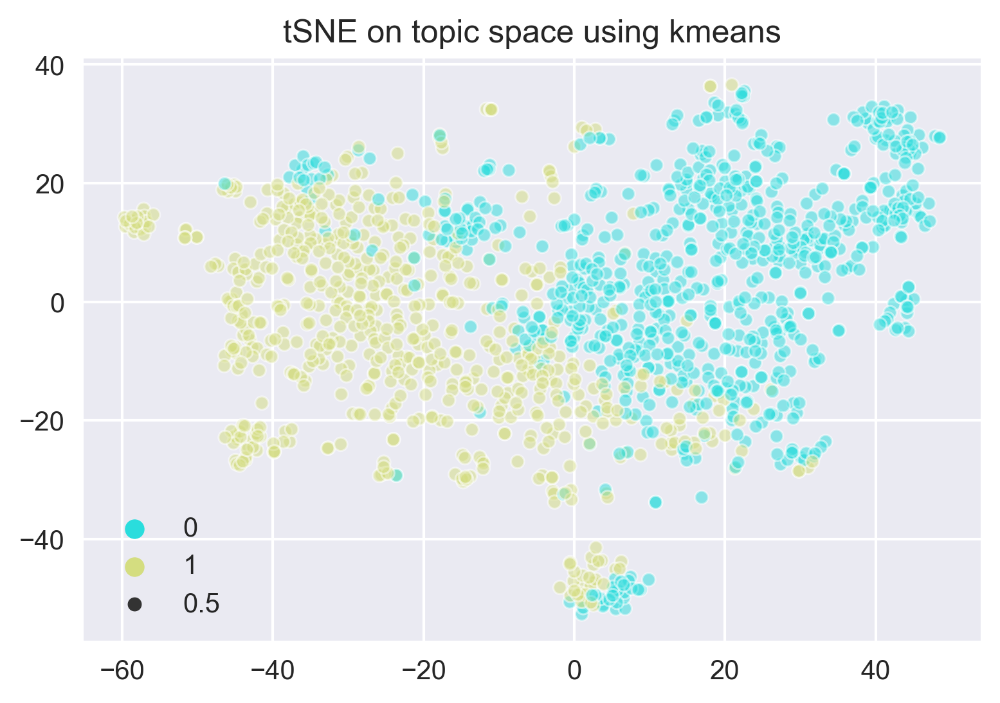

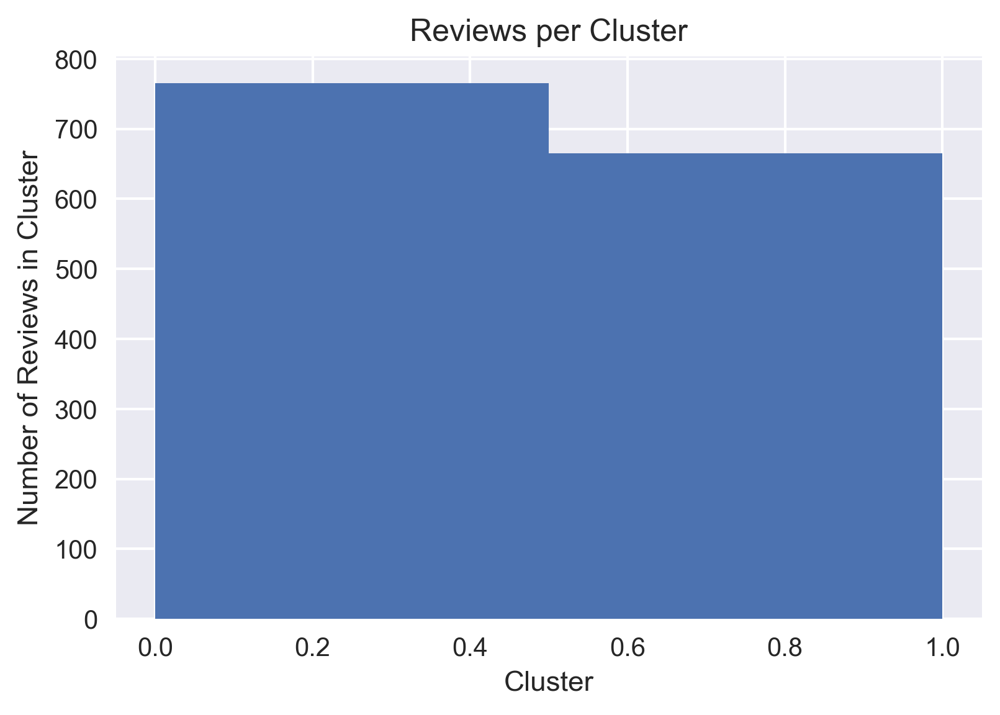

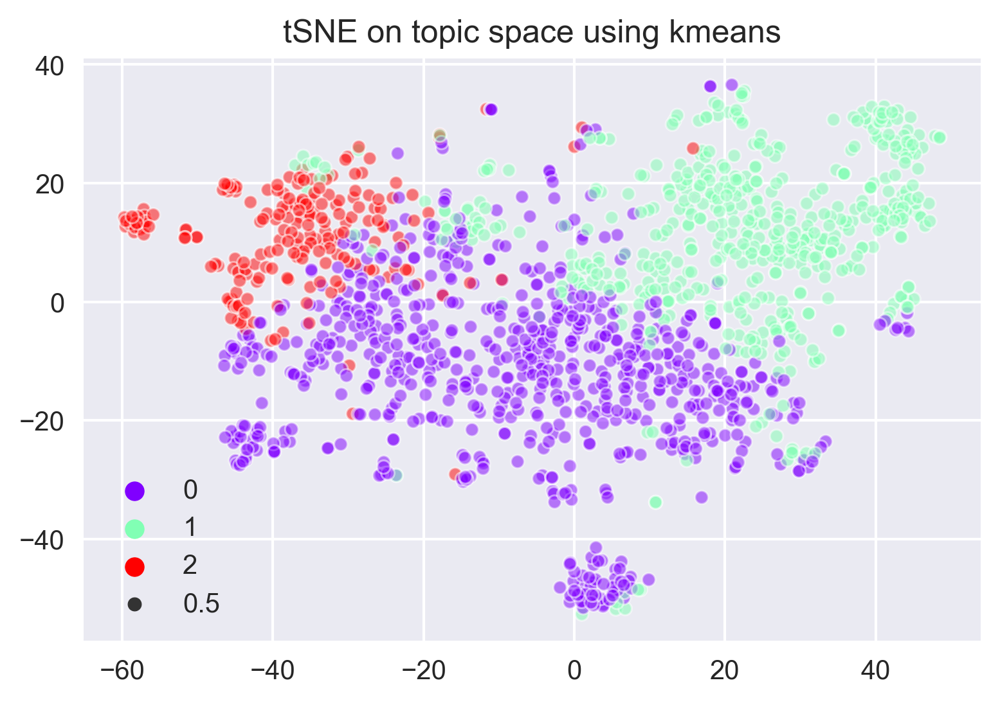

...

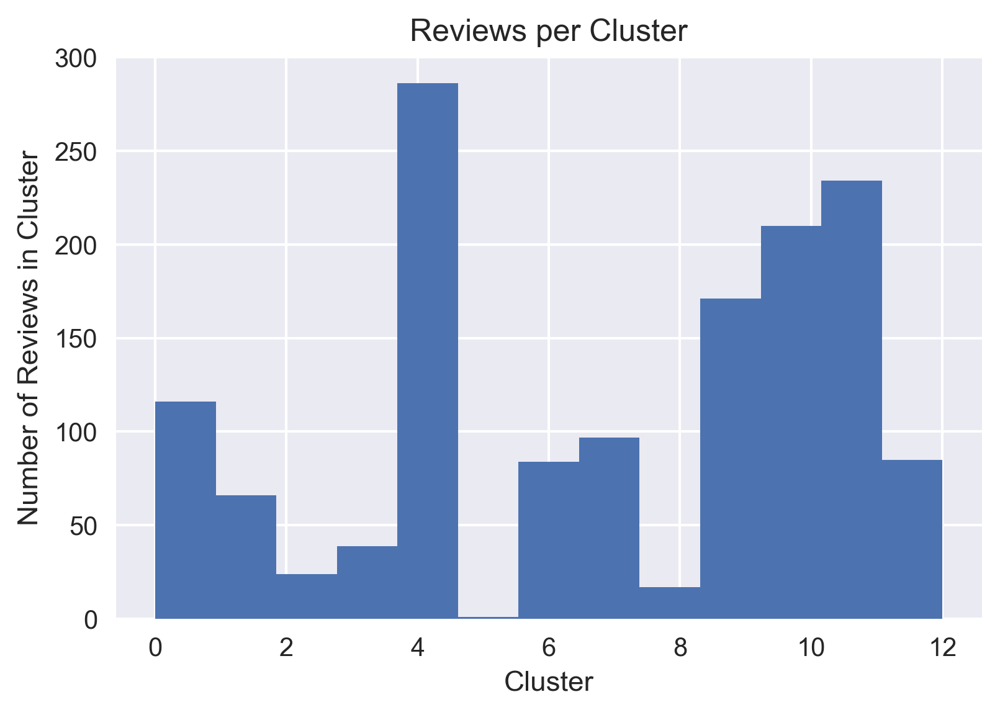

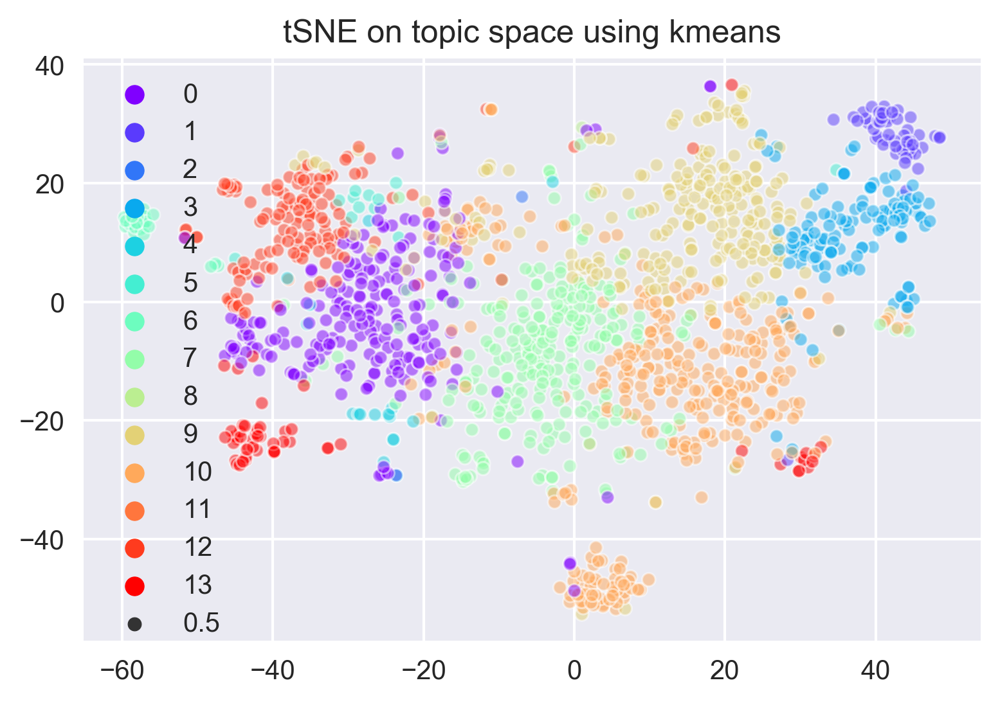

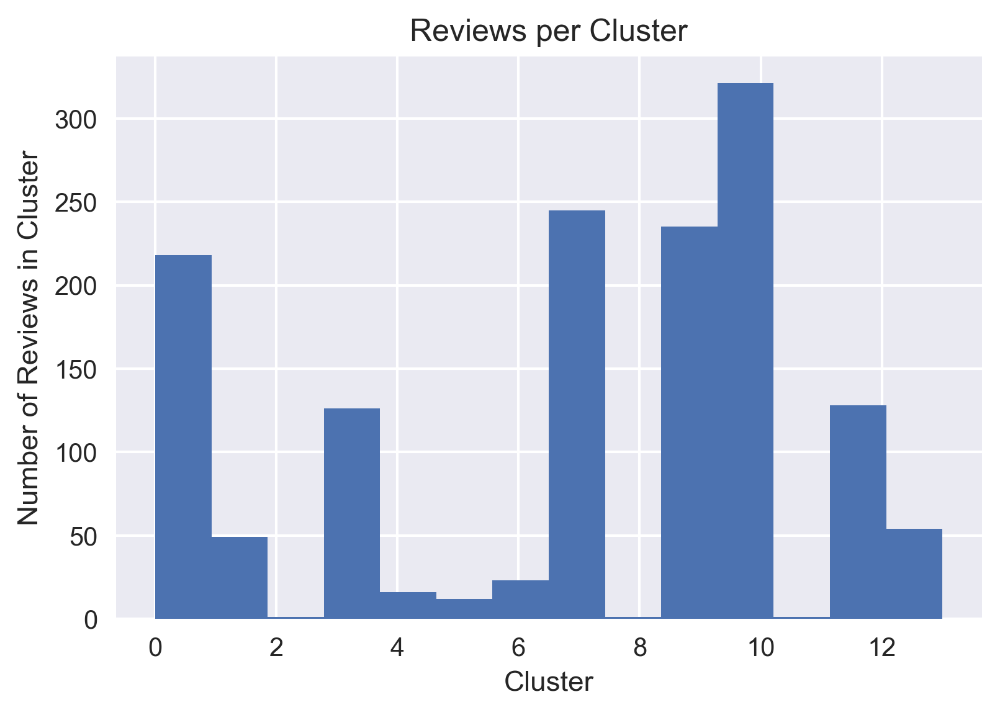

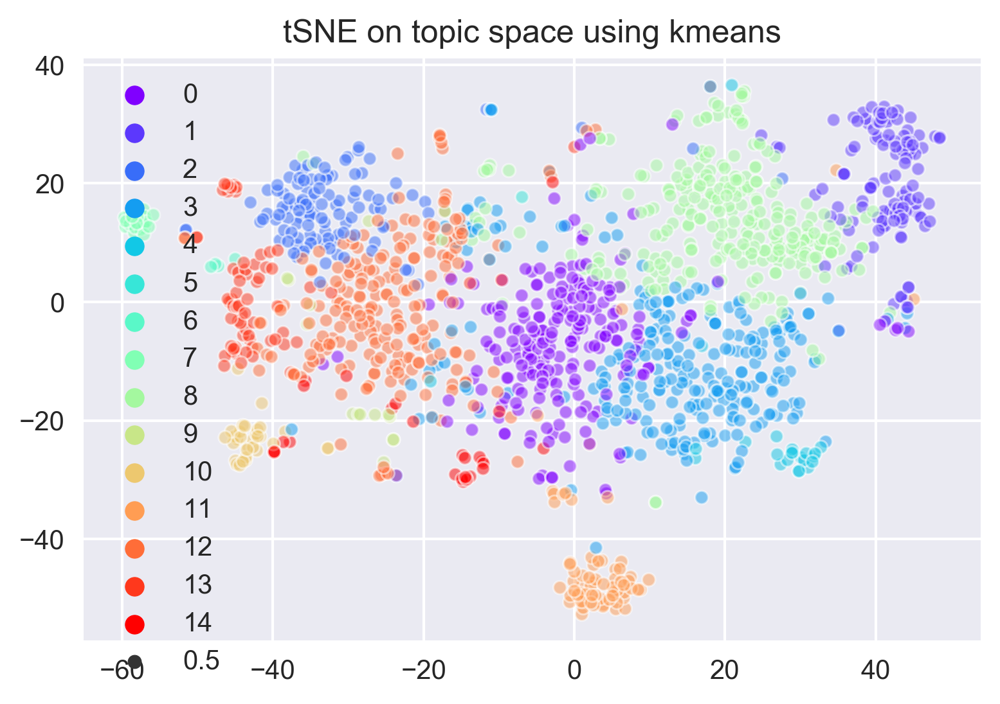

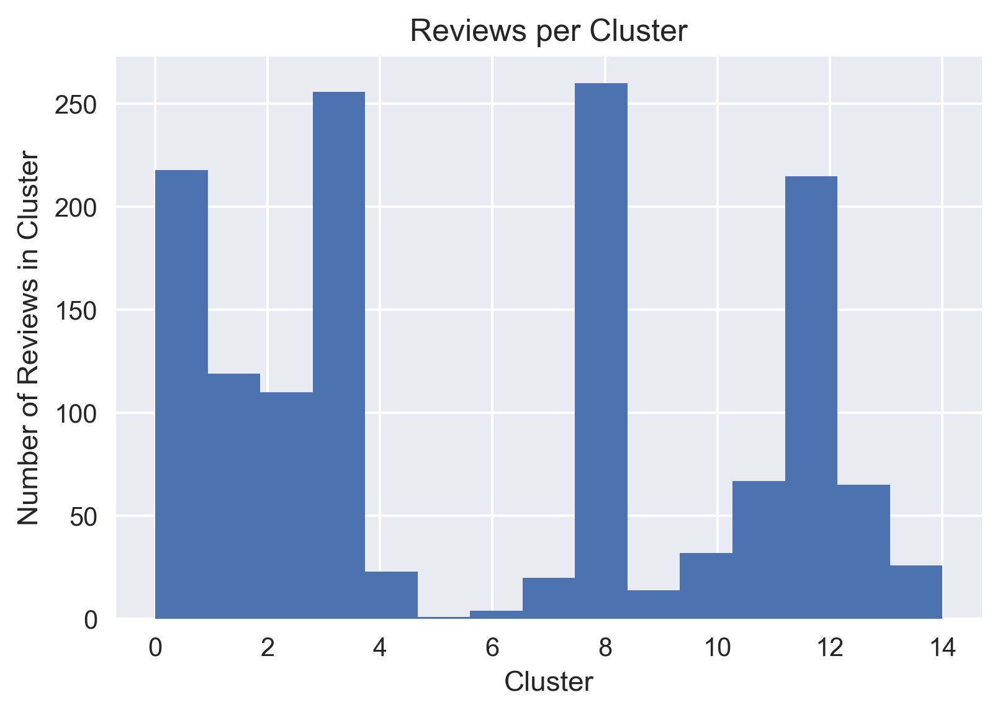

In [21]:
many_kmeans(km_cluster, 15, df_std, names, 2, 30)

# DBSCAN

In [22]:
db_cluster=clustering_algorithms.clustering_pipeline(100)
db_cluster.fit(df_std)

many_db(db_cluster, eps=17, min_samples=3)


-------------------------------------NEXT CLUSTER -------------------------------------------


In [23]:
db_cluster.n_clusters

4

In [24]:
sum([1 for label in db_cluster.labels_ if label == -1]) / len(db_cluster.labels_)

0.09160839160839161

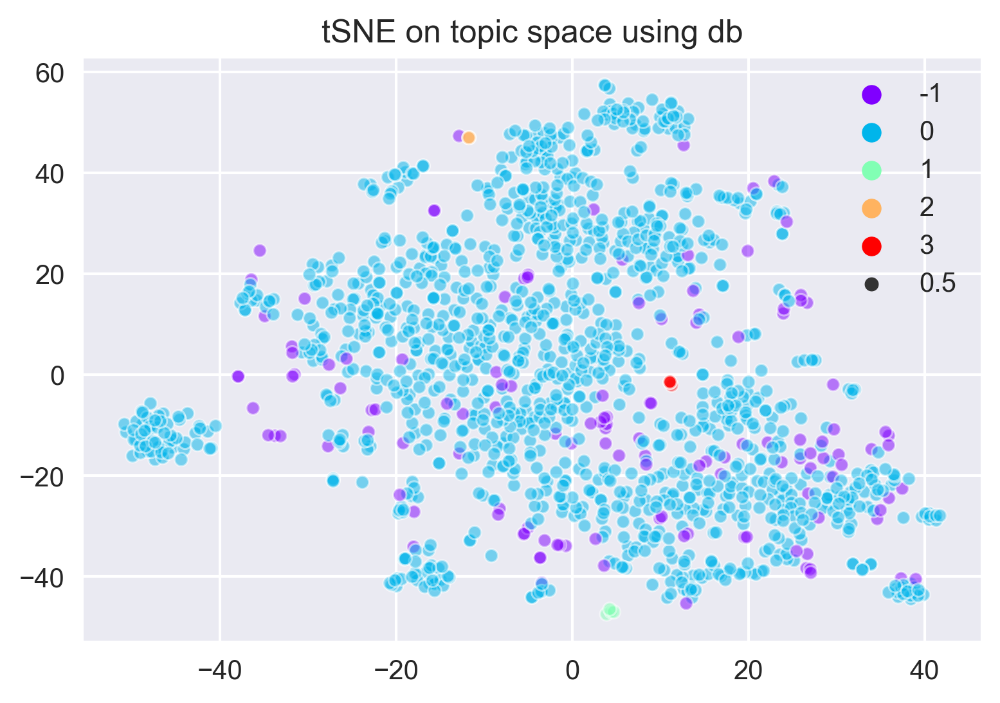

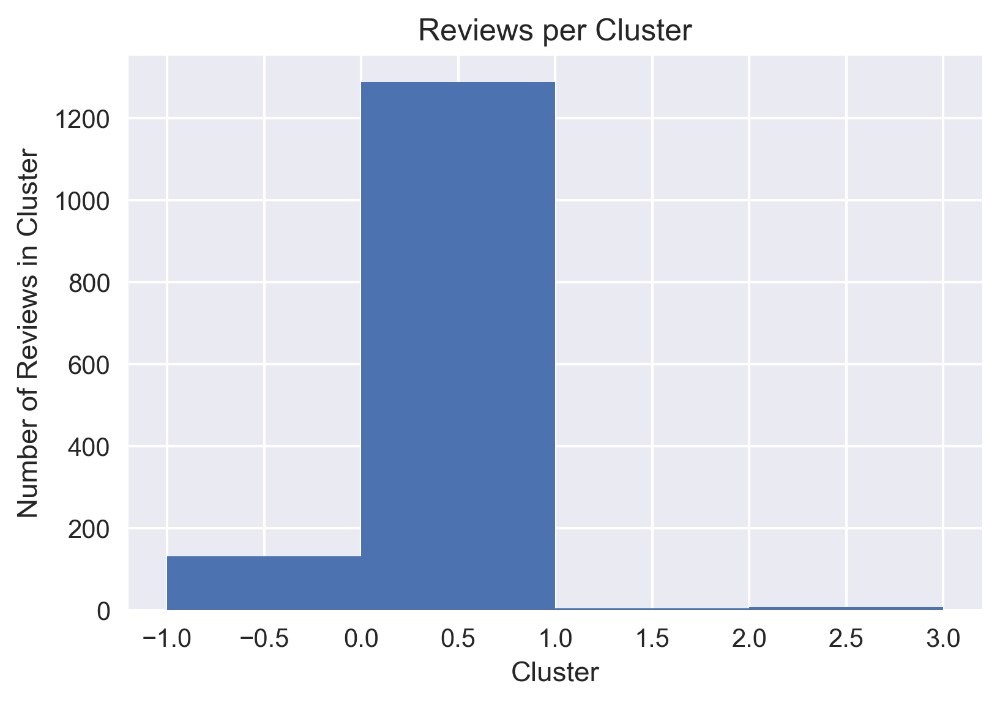

In [25]:
db_cluster.tsne(2, 30);

# Mean Shift

In [26]:
ms_cluster=clustering_algorithms.clustering_pipeline(100)

In [27]:
ms_cluster.fit(df_std)

In [28]:
many_meanshift(ms_cluster, 0.3, 10, df_std, names)

number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER -------------------------------------------
number of estimated clusters : 2

-------------------------------------NEXT CLUSTER --------------------

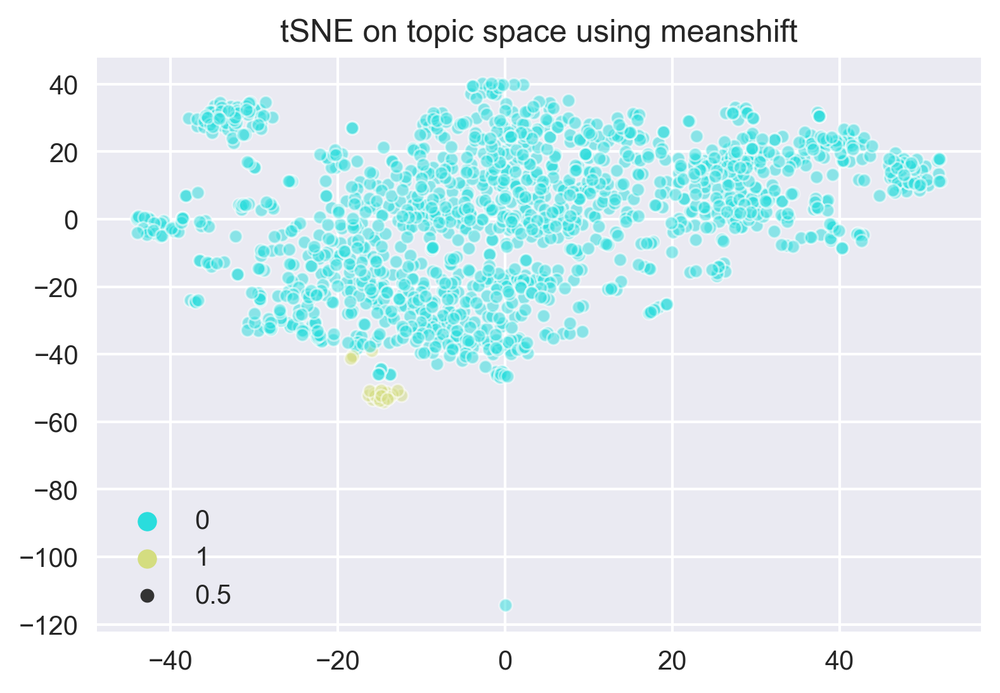

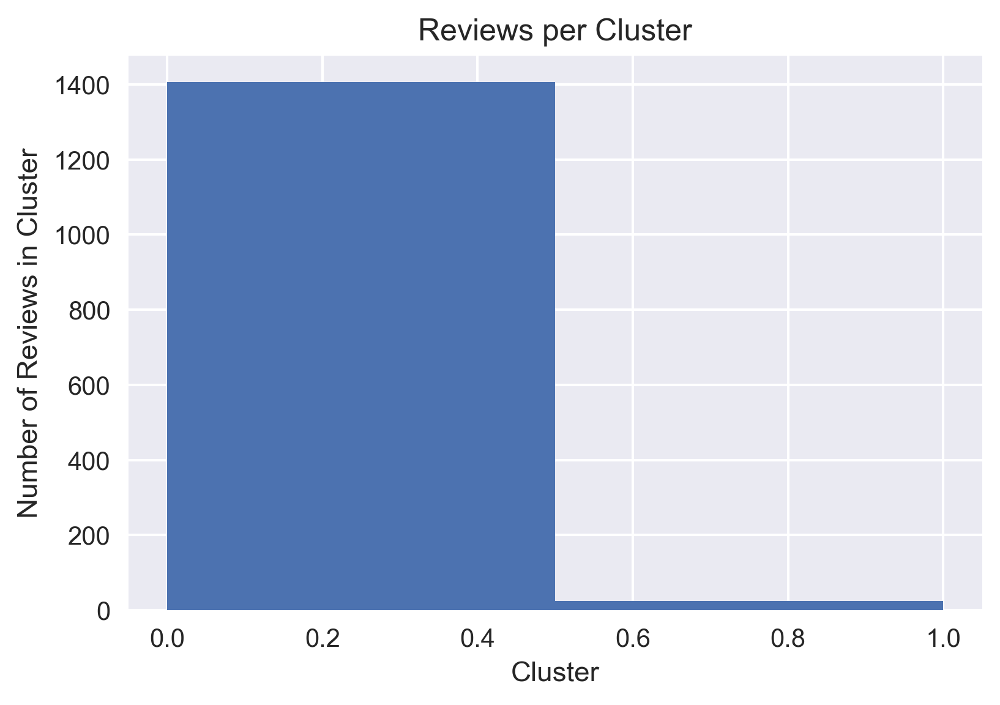

In [29]:
ms_cluster.tsne(2, 30);

# Spectral
See 'Spectral Notebook', created due to time constraints

In [ ]:
df.to_pickle('spectral.pkl')

# Finding the Closest Schools to A Given One

In [30]:
def three_closest_to_x(cluster, x, column):
    x= list(column).index(x)
    overall_clusters=[]
    distances=[]
    for index, vector in enumerate(cluster.data):
        dist = cosine_similarity(cluster.data[x],vector)
        distances.append((dist, index))
    distances.sort()
    indices=[x[1] for x in distances[-4:]]
    print( f"\n + {distances[-4:]}")
    for i in indices:
        print("\n" + column[i])

# Final Cluster and Sample Output

Create and Fit Cluster

In [31]:
final_cluster=clustering_algorithms.clustering_pipeline(100)
final_cluster.fit(df_std)

Run Kmeans with 12 Clusters

In [32]:
final_cluster.kmeans(10)

View TSNE

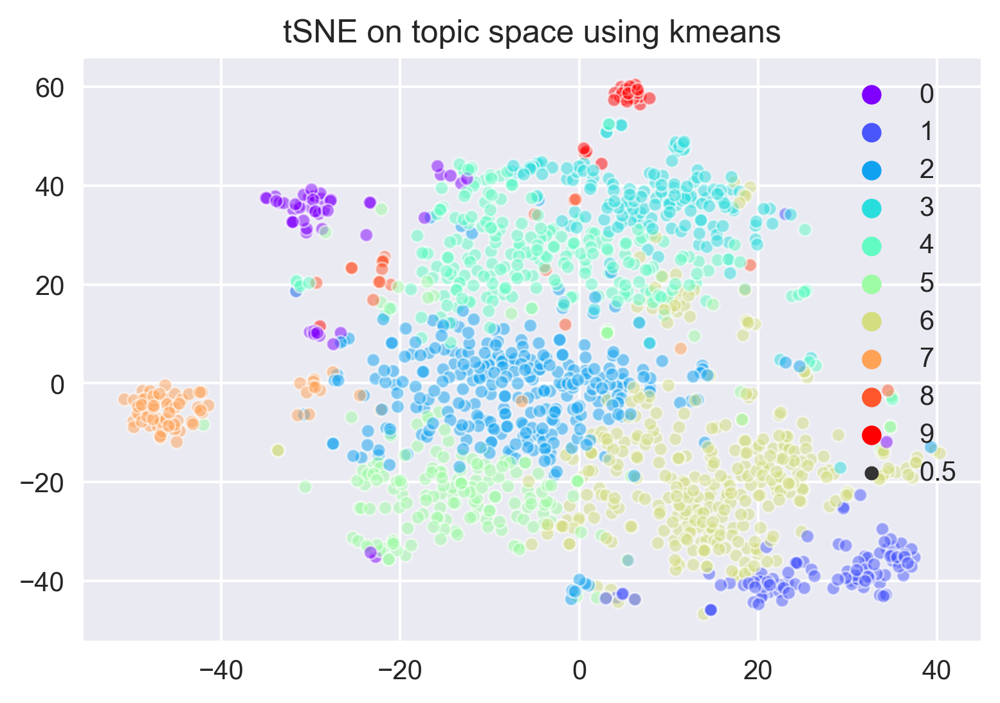

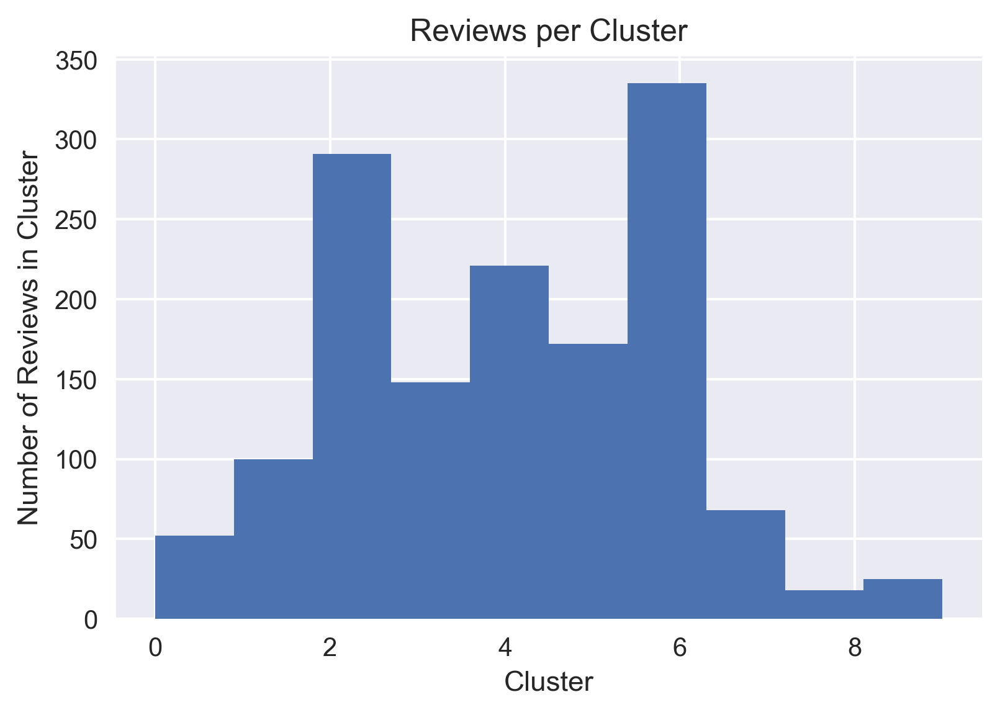

In [33]:
final_cluster.tsne(2,30)

**Discern Meaning** Using points closest and farthest to centroids

In [34]:
best_cluster(final_cluster, df, names)


 + [(0.9062384773839839, 1380), (0.9261868646833763, 1176), (0.9305509938572775, 1377), (0.9389628467435115, 1373)]
 
Closest to Center
Inter American University of Puerto Rico-Fajardo
Inter American University of Puerto Rico-Arecibo
Inter American University of Puerto Rico-Guayama
Colegio Universitario de San Juan
 
Farthest from Center
Simpson College
Luther College
Otterbein University
Ohio Northern University

 + [(0.9150574462824882, 579), (0.9176427104348605, 1008), (0.9177283151966963, 847), (0.9179966480120342, 444)]
 
Closest to Center
Carleton College
Franklin and Marshall College
Davidson College
Colby College
 
Farthest from Center
Northwestern State University of Louisiana
University of Mount Olive
University of South Carolina-Upstate
Austin Peay State University

 + [(0.7560289241333021, 371), (0.756912678730478, 1012), (0.7748888426732881, 1104), (0.7845209649866358, 384)]
 
Closest to Center
Baker University
Gwynedd Mercy University
Southern Wesleyan University
MidAmer

Some Sample Schools

In [35]:
three_closest_to_x(final_cluster, x='Wellesley College', column=names)


 + [(0.822474789428662, 478), (0.842499519146625, 116), (0.8952201316402847, 729), (1.0, 527)]

Amherst College

Scripps College

Barnard College

Wellesley College


In [36]:
three_closest_to_x(final_cluster, x='Claremont McKenna College', column=names)


 + [(0.8249865730706426, 108), (0.8384075179728921, 733), (0.8534138602850775, 442), (1.0, 84)]

Pomona College

Colgate University

Bates College

Claremont McKenna College


In [37]:
three_closest_to_x(final_cluster, x='Harvey Mudd College', column=names)


 + [(0.7605281334496949, 1023), (0.7725289299743443, 579), (0.7856760458539717, 55), (1.0, 89)]

Lafayette College

Carleton College

California Institute of Technology

Harvey Mudd College


In [38]:
three_closest_to_x(final_cluster, x='Princeton University', column=names)


 + [(0.8498428050094439, 848), (0.8613106448429165, 1203), (0.8850202236584419, 159), (1.0, 708)]

Duke University

Rice University

Yale University

Princeton University


# Set Up for Flask

In [37]:
with open('cluster.pkl', 'wb') as f:
    pickle.dump(final_cluster, f)

In [ ]:
df.to_pickle('data.pkl')
names.to_pickle('names.pkl')

In [42]:
with open('scaled_data.pkl', 'wb') as f:
    pickle.dump(df_std, f)